# Fire Risk
This notebook provides a look at fire hazard responsibility areas in LA.

First, I imported panda and directed python to the geojson file that I will be using. 

In [2]:
import pandas as pd
import geopandas as gpd

In [3]:
fire = gpd.read_file('FHRA.geojson')

ERROR 1: PROJ: proj_create_from_database: Open of /opt/conda/share/proj failed


Next, I asked for the description of the data type.

In [4]:
type(fire)

geopandas.geodataframe.GeoDataFrame

This is a geo data frame for geopandas

Next, I asked python to show me an example of the first five rows.

In [5]:
fire.head()

,OBJECTID,SRA,HAZ_CODE,HAZ_CLASS,INCORP,VH_REC,ShapeSTArea,ShapeSTLength,geometry
0,1,SRA,1,Moderate,,,1.171925e+06,10152.533537,"POLYGON ((-118.43555 33.31935, -118.43555 33.3..."
1,2,SRA,1,Moderate,,,6.370045e+06,16677.834799,"POLYGON ((-118.30828 33.30744, -118.30803 33.3..."
2,3,SRA,1,Moderate,,,1.527167e+07,76329.243889,"POLYGON ((-118.32574 33.29921, -118.32574 33.2..."
3,4,SRA,1,Moderate,,,1.790197e+06,18640.815925,"POLYGON ((-118.44812 33.32033, -118.44783 33.3..."
4,5,SRA,1,Moderate,,,1.164026e+06,10179.022797,"POLYGON ((-118.47215 33.33364, -118.47199 33.3..."


It previews the table, shoowing polygons and assigned hazard risk and responsibility entity for the fire risk.

Next, I wanted to see the total number of rows and columns

In [10]:
fire.shape

(940, 9)

There are 940 rows and 9 columns.

Next, we asked python for a basic overview of the data, with columns, and the top and bottom rows as well as the number of columns and rows.

In [11]:
fire.info

<bound method DataFrame.info of      OBJECTID  SRA  HAZ_CODE  HAZ_CLASS INCORP VH_REC   ShapeSTArea  \
0           1  SRA         1   Moderate                1.171925e+06   
1           2  SRA         1   Moderate                6.370045e+06   
2           3  SRA         1   Moderate                1.527167e+07   
3           4  SRA         1   Moderate                1.790197e+06   
4           5  SRA         1   Moderate                1.164026e+06   
..        ...  ...       ...        ...    ...    ...           ...   
935       936  LRA         3  Very High                4.092768e+01   
936       937  LRA         3  Very High                6.166817e+03   
937       938  LRA         3  Very High                1.087819e+06   
938       939  LRA         3  Very High                3.101083e+01   
939       940  LRA         3  Very High                2.912888e+05   

     ShapeSTLength                                           geometry  
0     10152.533537  POLYGON ((-118.43555 33

Next, I asked for counts for the different categories of responsibility areas.

In [16]:
fire['SRA'].value_counts()

SRA
LRA    429
SRA    261
FRA    250
Name: count, dtype: int64

The largest category of responsibility is for local responsibility areas (LRA), but there are also important roles for the state (SRA) and federal (FRA) governments.

Next, I asked for counts for each category of the level of hazard risk.

In [18]:
fire['HAZ_CLASS'].value_counts()

HAZ_CLASS
Very High    762
High         118
Moderate      60
Name: count, dtype: int64

Most of the polygons in this dataset are very high risk.

In [ ]:
I then did a basic plot for the data to get a sense of how the polygons were placed.

<Axes: >

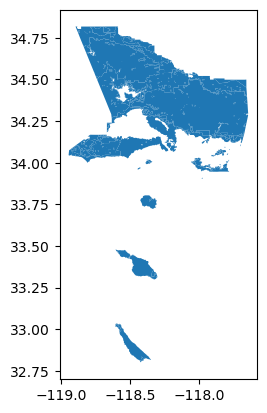

In [22]:
fire.plot()

This map does give us a spatial layout of the risk areas, but it also is a slightly confusing sense of space. Now, we'll add folium map for more context. 

In [7]:
import folium

After adding the map, I zoomed in the map to approximately Los Angeles

In [8]:
m = folium.Map(location=[34, -118], zoom_start=10, tiles="CartoDB positron")
m


Next, I added the polygons from the data to a map

In [11]:
for _, r in fire.iterrows():
    sim_geo = gpd.GeoSeries(r["geometry"])
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j, style_function=lambda x: {"fillColor": "red"})
    folium.Popup(r["HAZ_CLASS"]).add_to(geo_j)
    geo_j.add_to(m)
m

Here we see high fire risk to the west and North of Los Angeles as well as Catalina islands, which might lead us to thinking about pairing this data with increased greenery and development.

Finally, I filtered the data to include the columns of highest importance, excluding two that didn't have information to clean up the data.

In [12]:
fireb = ['OBJECTID','SRA','HAZ_CODE','HAZ_CLASS','ShapeSTArea','ShapeSTLength','geometry']